In [1]:
import sys
sys.path.append("../")

In [26]:
import os
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

from src.config import CLASS_MAPPINGS_REVERTED
from src.primitives.api import ServiceSpecs
from src.app.proxy import ObjectSegmentationServiceClient

from src.data_access.data_transformations import EntryTransformation, \
    DataAugmentation, DataStandardisation, DataTransformationChain
from src.primitives.data_access import DataSetSplit
from src.data_access.data_generation import DataGenerator
from src.utils.fs_utils import parse_json
from src.utils.images import load_image

In [3]:
! ../run_app.sh

/home/ppeczek/anaconda3/envs/YetAnotherSegmentationExperiment/bin/python: Error while finding module specification for 'src.app.app' (ModuleNotFoundError: No module named 'src')


In [28]:
EXPERIMENT_RESULTS_ROOT = "/home/ppeczek/Dokumenty/YetAnotherSegmentationExperiment/resources/experiments/test_experiment_v1/ic_net/random_split_#0"
SPLIT_JSON = os.path.join(
    EXPERIMENT_RESULTS_ROOT, "dataset.split.json"
)
SPLIT = parse_json(SPLIT_JSON)
SPLIT = DataSetSplit.from_dict(SPLIT)
BACKGROUNDS_PATHS = glob(BACKGROUNDS_WILDRCARD)
BACKGROUNDS = [load_image(path, cv.COLOR_BGR2RGB) for path in BACKGROUNDS_PATHS]
ENTRY_TRANSFORMATION = EntryTransformation(
    class_mapping=CLASS_MAPPINGS,
    target_size=MODEL_INPUT_SIZE,
    backgrounds=BACKGROUNDS
)
transformatrion_chain = DataTransformationChain(
    entry_transformation=ENTRY_TRANSFORMATION,
    augmentations=[]
)
test_generator = DataGenerator(
    examples=SPLIT.test_set.examples,
    transformation_chain=transformatrion_chain,
    batch_size=16
)

In [30]:
images = []
for i in range(len(test_generator)):
    batch = test_generator[i][0]
    for j in range(batch.shape[0]):
        images.append(batch[j])

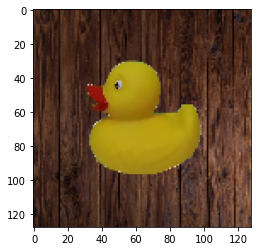

In [33]:
plt.imshow(images[0])

In [34]:
servSpecs = ServiceSpecs(
    host='0.0.0.0',
    port=2137,
    service_name="OBJECT_SEGMENTATION_SERVICE_NAME",
    version='v1'
)

cli = ObjectSegmentationServiceClient(servSpecs)

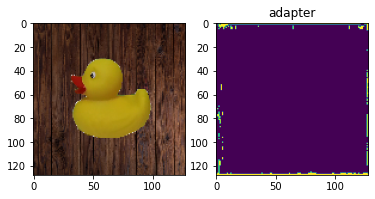

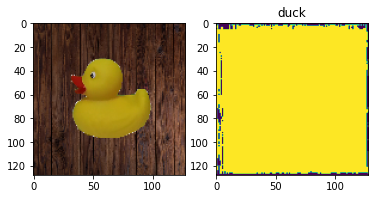

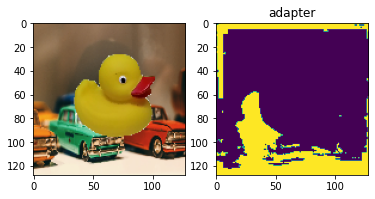

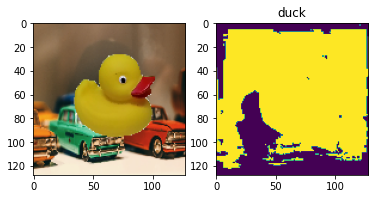

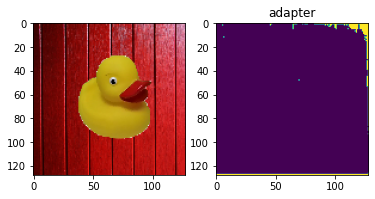

...

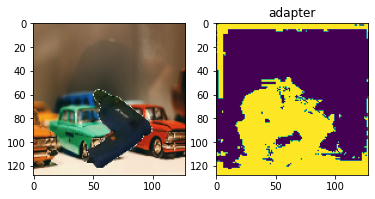

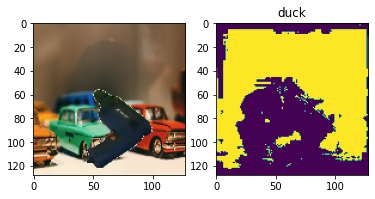

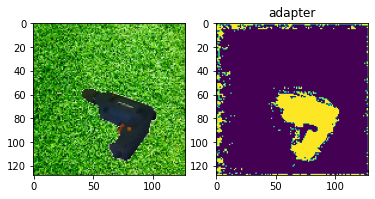

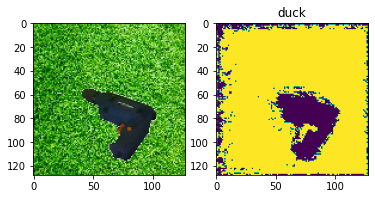

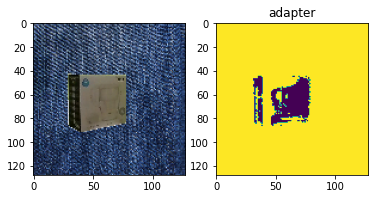

KeyboardInterrupt: 

In [35]:
for image in images:
    results = cli.get_segmentation(image)
    for result in results:
        class_idx = result.class_idx
        mask = result.binary_mask
        plt.subplot(121)
        plt.imshow(image)
        plt.subplot(122)
        plt.imshow(mask)
        plt.title(CLASS_MAPPINGS_REVERTED[class_idx])
        plt.show()